# TP2 - Etapa 3: Detección y clasificación de razas de perros

Pipeline completo: detección de perros con YOLOv8 → recorte → clasificación de raza
con el modelo entrenado en Etapa 2.

## Equipo
- Alumno 1 : Esteva Matias (E-1253/1)

## Setup

In [1]:
import os, sys
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import random


os.environ["USE_PGVECTOR"] = "false"

ROOT = Path.cwd()
sys.path.insert(0, str(ROOT / "src"))

from lib.config import settings
from lib.bootstrap import build_classifier, build_detection
import torch
print("GPU disponible:", torch.cuda.is_available())

GPU disponible: True


In [2]:
classifier = build_classifier(settings)
classifier.set_active_model("resnet18_finetuned")  # cnn_custom

detection_svc = build_detection(settings, classifier)

## 1. Detección con YOLOv8

YOLOv8n es un modelo preentrenado en COCO (80 clases). La clase 16 corresponde a 'dog'.
Se usa sin reentrenamiento, solo detección de bounding boxes.

In [3]:
def mostrar_detecciones(img_path: str, detection_svc, figsize=(12, 7)):
    """Corre el pipeline completo y muestra la imagen con bboxes y razas."""
    image = cv2.imread(img_path)
    if image is None:
        raise ValueError(f"No se pudo leer: {img_path}")

    detections = detection_svc.detect_dogs(image)
    detection_svc.conf_threshold = 0.40

    if not detections:
        print("No se detectaron perros en la imagen.")
        plt.figure(figsize=figsize)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title("Sin detecciones")
        plt.show()
        return

    img_draw = image.copy()
    height, width = img_draw.shape[:2]

    resultados = []
    for (box, det_score) in detections:
        x1, y1, x2, y2 = box
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(width, x2), min(height, y2)

        crop = image[y1:y2, x1:x2]
        breed, breed_score = detection_svc.classify_detected_dog(crop)
        resultados.append((box, det_score, breed, breed_score))

        # Bbox
        cv2.rectangle(img_draw, (x1, y1), (x2, y2), (0, 200, 0), 2)
        label = f"{breed} ({breed_score:.2f})"
        (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)
        cv2.rectangle(img_draw, (x1, y1 - th - 6), (x1 + tw, y1), (0, 200, 0), -1)
        cv2.putText(img_draw, label, (x1, y1 - 4),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 1)

    # Imagen con bboxes
    fig, axes = plt.subplots(1, len(detections) + 1,
                             figsize=(5 * (len(detections) + 1), 5))
    if len(detections) == 1:
        axes = [axes] if not hasattr(axes, '__len__') else axes

    axes[0].imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"{len(detections)} perro(s) detectado(s)")
    axes[0].axis("off")

    for i, (box, det_score, breed, breed_score) in enumerate(resultados):
        x1, y1, x2, y2 = box
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(width, x2), min(height, y2)
        crop = image[y1:y2, x1:x2]
        axes[i + 1].imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
        axes[i + 1].set_title(f"{breed}\ndet={det_score:.2f}  cls={breed_score:.2f}")
        axes[i + 1].axis("off")

    plt.tight_layout()
    plt.show()

## 2. Prueba con imágenes del conjunto de test
Imágenes que el modelo no vio durante el entrenamiento.


Raza real: Border Collie


INFO:lib.services.detection_service:detect_dogs: 1 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Border Collie (0.9936)


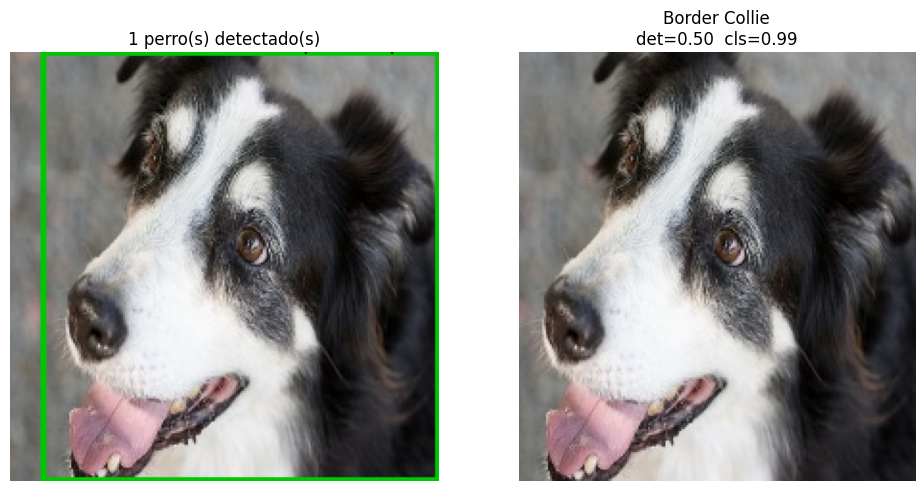

INFO:lib.services.detection_service:detect_dogs: 1 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: American Hairless (0.9928)



Raza real: American Hairless


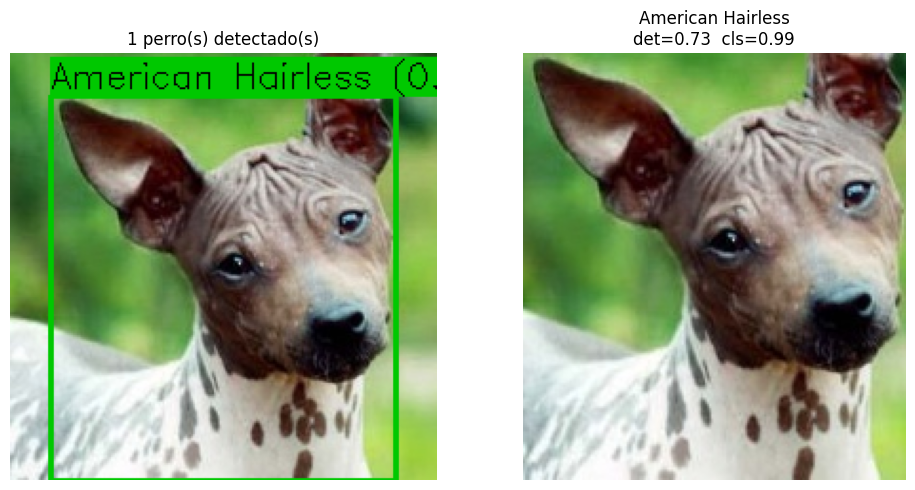

INFO:lib.services.detection_service:detect_dogs: 1 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Elk Hound (0.9986)



Raza real: Elk Hound


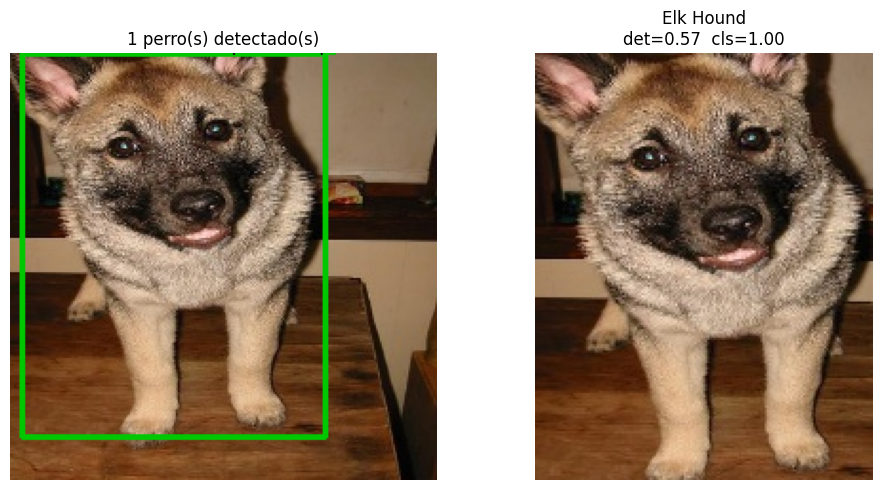

INFO:lib.services.detection_service:detect_dogs: 1 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Dalmation (1.0000)



Raza real: Dalmation


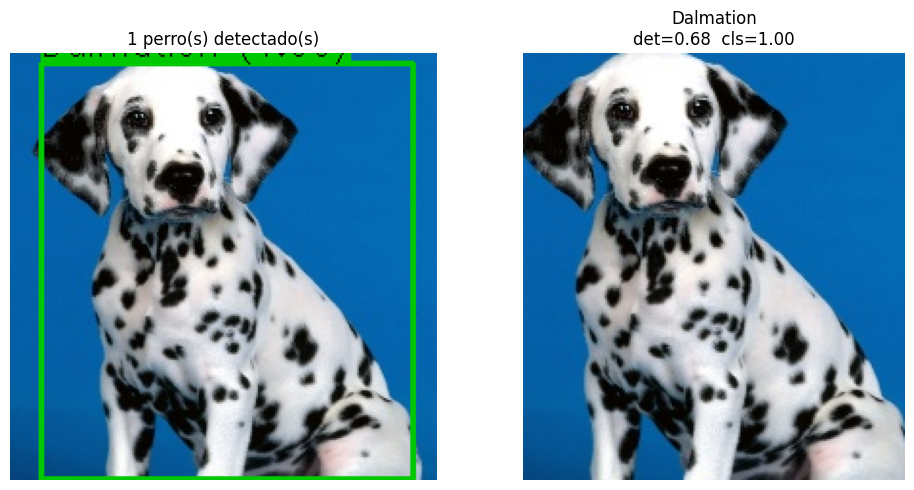


Raza real: Collie


INFO:lib.services.detection_service:detect_dogs: 1 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Collie (0.9999)


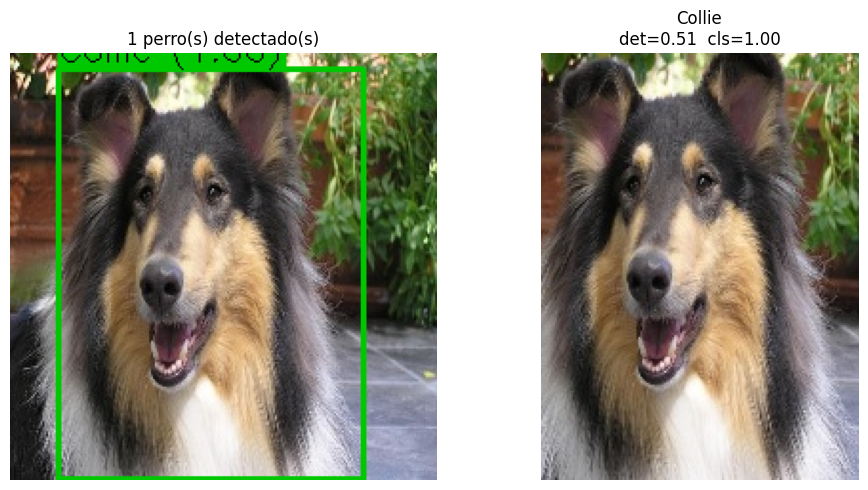

In [4]:
test_path = settings.dataset_path / "test"
breeds    = sorted([d.name for d in test_path.iterdir() if d.is_dir()])

# 5 razas al azar y una imagen de cada una
random.seed(42)
sample_breeds = random.sample(breeds, 5)

for breed in sample_breeds:
    imgs = list((test_path / breed).iterdir())
    img_path = str(random.choice(imgs))
    print(f"\nRaza real: {breed}")
    mostrar_detecciones(img_path, detection_svc)

## 3. Prueba con imágenes externas (no pertenecen al dataset)
Imágenes descargadas de internet para evaluar el pipeline en condiciones reales.

INFO:lib.services.detection_service:detect_dogs: 2 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Bermaise (0.9970)
INFO:lib.services.detection_service:classify_detected_dog: Dhole (0.2968)



Imagen: foto12.jpg


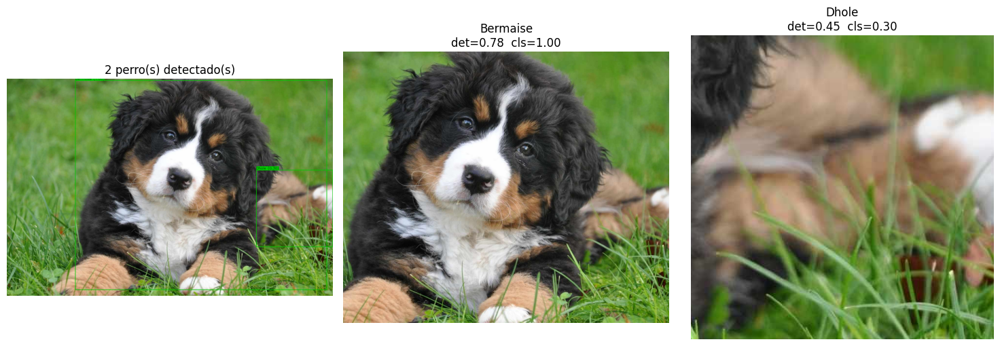

INFO:lib.services.detection_service:detect_dogs: 1 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Golden Retriever (0.9729)



Imagen: foto3.jpg


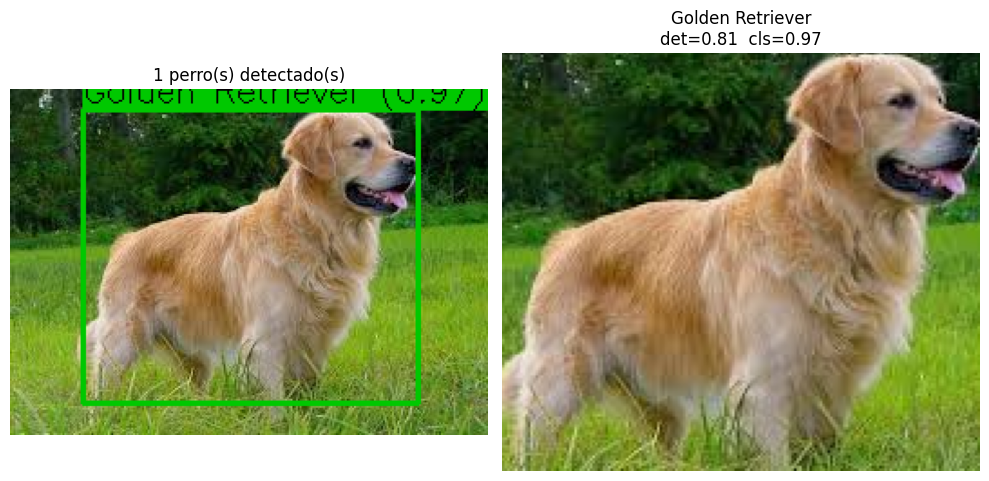

INFO:lib.services.detection_service:detect_dogs: 1 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Labrador (0.3428)



Imagen: foto5.jpg


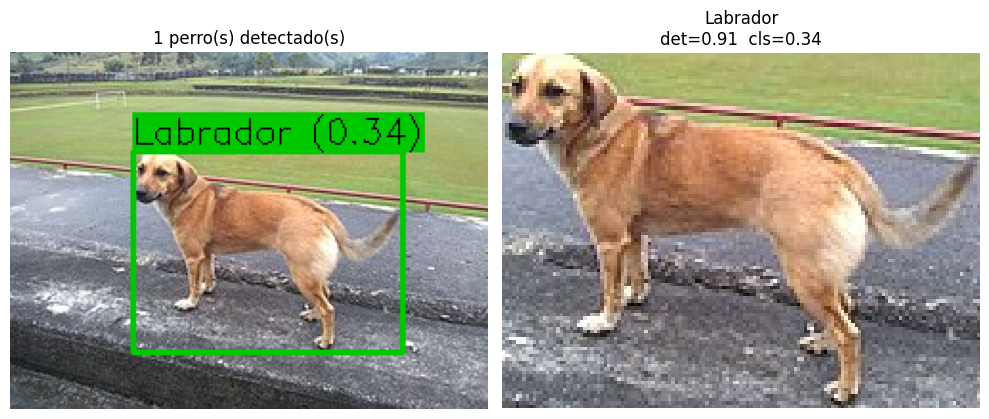


Imagen: foto7.jpg


INFO:lib.services.detection_service:detect_dogs: 1 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Boxer (0.9991)


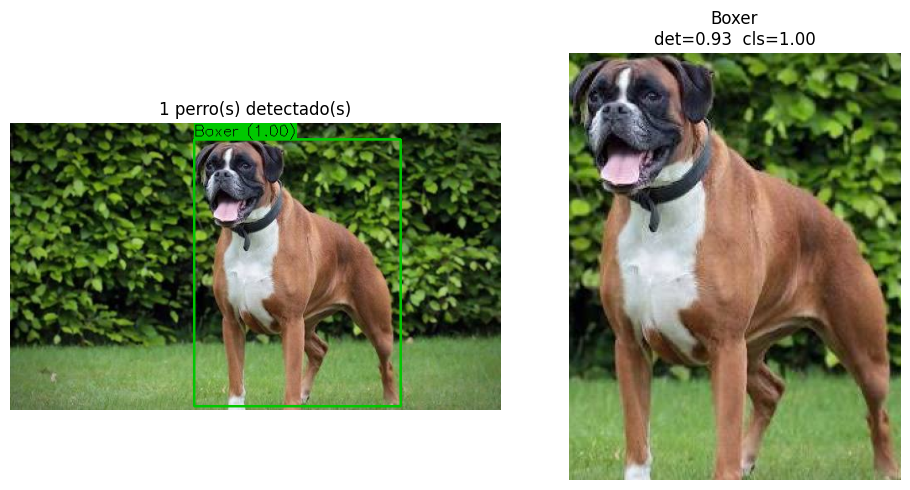

INFO:lib.services.detection_service:detect_dogs: 1 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Great Dane (0.5954)



Imagen: foto8.jpg


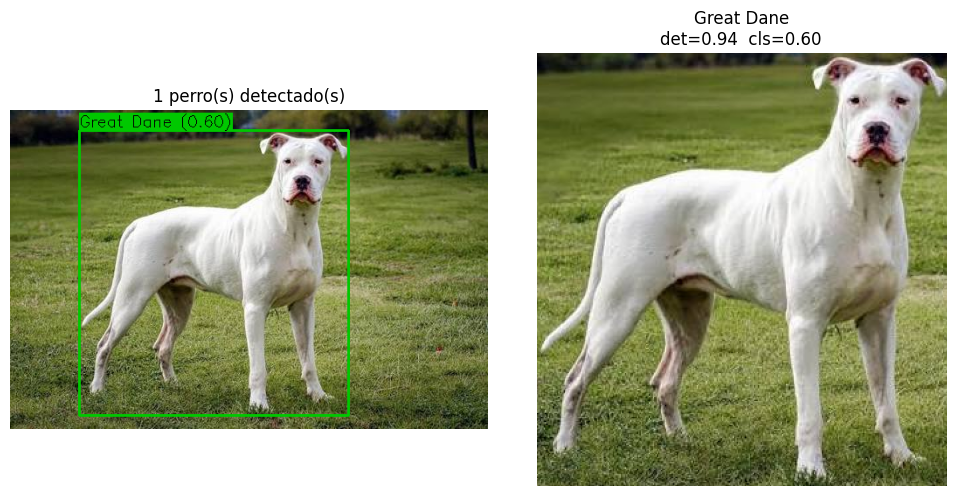

In [5]:
mis_imagenes = list(Path("data/pruebas").glob("*.jpg")) + \
               list(Path("data/pruebas").glob("*.png"))

for img_path in mis_imagenes:
    print(f"\nImagen: {img_path.name}")
    mostrar_detecciones(str(img_path), detection_svc)

## 4. Escenas con múltiples perros
Imágenes con más de un perro para verificar que el pipeline detecta y clasifica
cada uno de forma independiente.


Imagen: foto1.jpg


INFO:lib.services.detection_service:detect_dogs: 4 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Golden Retriever (0.4935)
INFO:lib.services.detection_service:classify_detected_dog: Labrador (0.1960)
INFO:lib.services.detection_service:classify_detected_dog: Collie (0.2355)
INFO:lib.services.detection_service:classify_detected_dog: Siberian Husky (0.1742)


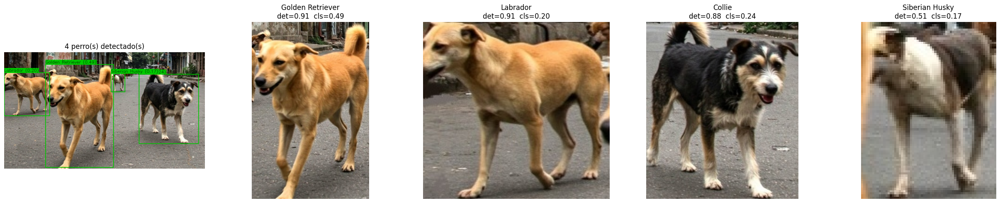

INFO:lib.services.detection_service:detect_dogs: 3 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Dingo (0.4660)
INFO:lib.services.detection_service:classify_detected_dog: Basenji (0.2279)
INFO:lib.services.detection_service:classify_detected_dog: Basenji (0.3885)



Imagen: foto10.jpg


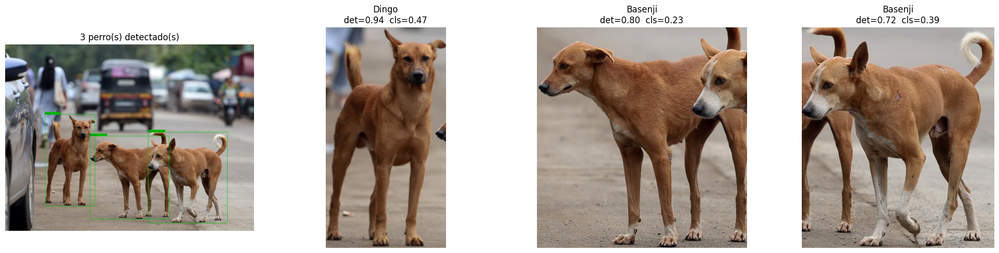

INFO:lib.services.detection_service:detect_dogs: 3 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Border Collie (0.5762)
INFO:lib.services.detection_service:classify_detected_dog: Great Dane (0.4330)
INFO:lib.services.detection_service:classify_detected_dog: Bluetick (0.5589)



Imagen: foto11.jpg


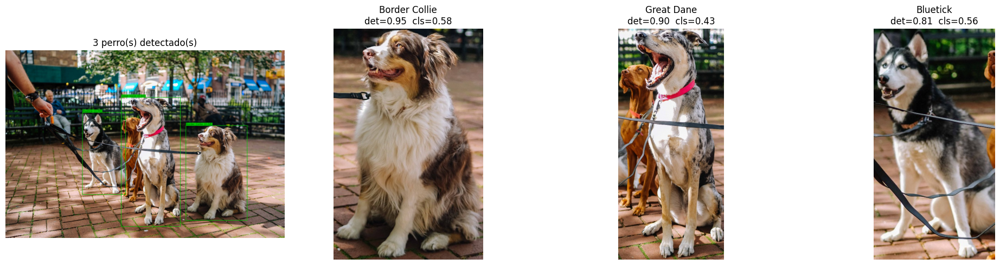

INFO:lib.services.detection_service:detect_dogs: 2 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Border Collie (0.5842)
INFO:lib.services.detection_service:classify_detected_dog: Collie (0.6335)



Imagen: foto2.jpg


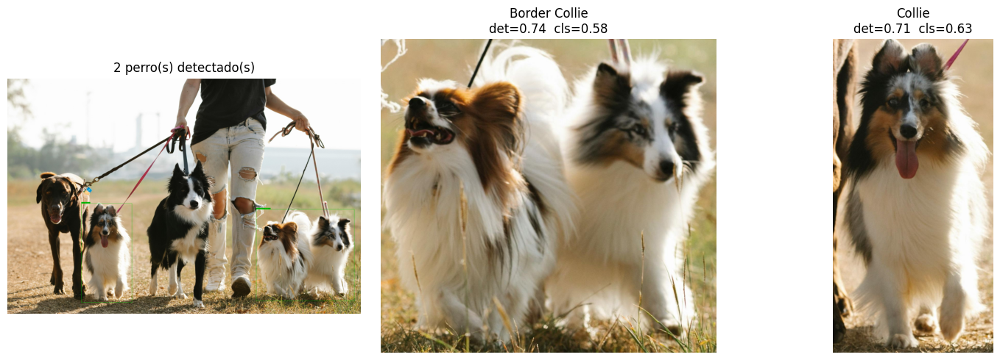

INFO:lib.services.detection_service:detect_dogs: 2 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: French Bulldog (0.9932)
INFO:lib.services.detection_service:classify_detected_dog: Labrador (0.9998)



Imagen: foto4.jpg


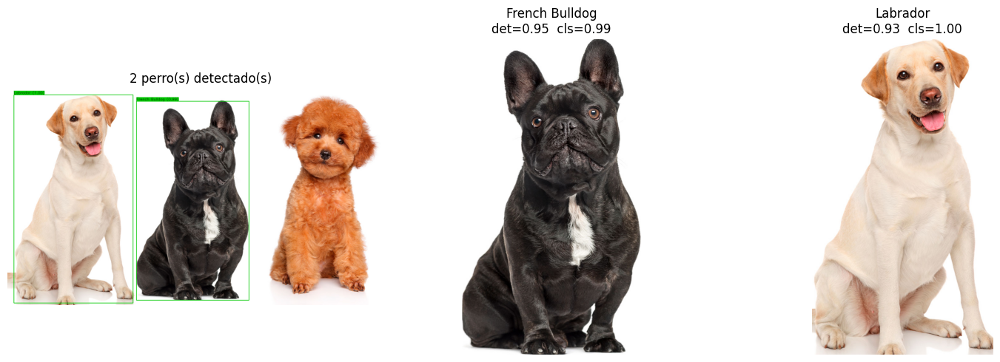

INFO:lib.services.detection_service:detect_dogs: 3 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Border Collie (0.9270)
INFO:lib.services.detection_service:classify_detected_dog: Borzoi (0.2285)
INFO:lib.services.detection_service:classify_detected_dog: Great Perenees (0.9307)



Imagen: foto6.jpg


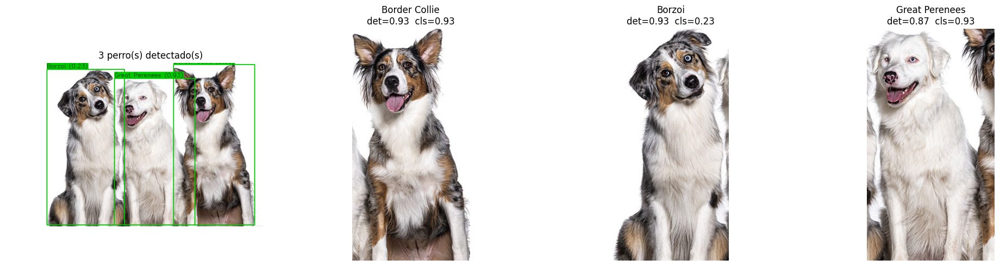

INFO:lib.services.detection_service:detect_dogs: 6 perro(s) detectado(s)
INFO:lib.services.detection_service:classify_detected_dog: Siberian Husky (0.6424)
INFO:lib.services.detection_service:classify_detected_dog: Cockapoo (0.7419)
INFO:lib.services.detection_service:classify_detected_dog: Siberian Husky (0.7226)
INFO:lib.services.detection_service:classify_detected_dog: Malinois (0.6275)
INFO:lib.services.detection_service:classify_detected_dog: Borzoi (0.1654)
INFO:lib.services.detection_service:classify_detected_dog: Siberian Husky (0.7645)



Imagen: foto9.jpg


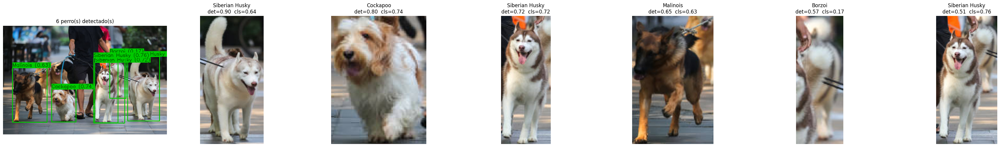

In [6]:
multi = list(Path("data/pruebas_multiples/").glob("*.[jp][pn]g"))

for img_path in multi:
    print(f"\nImagen: {img_path.name}")
    mostrar_detecciones(str(img_path), detection_svc)



- YOLOv8n detecta perros en diferentes escenarios sin necesidad
  de reentrenamiento, aprovechando el preentrenamiento en COCO. En determinados ejemplos no logra detectar alguna de las multiples instancias presentes en la foto y en otras detecta mas de un perro donde solamente se encuentra uno.
- El clasificador de raza (ResNet18 fine-tuned) recibe el recorte del bbox y predice
  la raza con el score de confianza.
- En escenas con múltiples perros, el pipeline procesa cada detección de forma
  independiente y retorna una raza por perro.
- Los casos de error más frecuentes son: perros parcialmente ocluidos, razas
  visualmente similares.